In [65]:
!pip install pyspark

In [47]:
import pandas as pd
import numpy as np
from faker import Faker

# Initialize Faker for Indian names
fake = Faker("en_IN")

# Define Subjects
subjects = ['Electronics', 'Programming', 'Database', 'Data Science', 'Mathematics', 'DSA']

# Generate 10,000 student profiles
num_students = 10000
unique_names = set()

# Generate unique names
while len(unique_names) < num_students:
    unique_names.add(fake.name())

unique_names = list(unique_names)

# Create student data
student_data = {
    "Student_ID": np.arange(1, 1 + num_students),
    "Name": unique_names,
}

# Generate random marks for each subject
for subject in subjects:
    student_data[subject] = np.random.randint(0, 95, num_students)  # Marks range 30-100

# Convert to DataFrame
df = pd.DataFrame(student_data)

# Save as CSV
df.to_csv("students_data.csv", index=False)

print("Student Data Generated Successfully!")


Student Data Generated Successfully!


In [21]:
from pyspark.sql import SparkSession
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
spark = SparkSession.builder.appName("Result Management System").getOrCreate()
df=pd.read_csv('students_data.csv')

In [66]:
df_spark = spark.createDataFrame(df)

In [67]:
df_spark.printSchema()
df_spark.describe().show()

root
 |-- Student_ID: long (nullable = true)
 |-- Name: string (nullable = true)
 |-- Electronics: long (nullable = true)
 |-- Programming: long (nullable = true)
 |-- Database: long (nullable = true)
 |-- Data Science: long (nullable = true)
 |-- Mathematics: long (nullable = true)
 |-- DSA: long (nullable = true)
 |-- Pass: boolean (nullable = true)

+-------+------------------+----------+-----------------+----------------+------------------+------------------+-----------------+------------------+
|summary|        Student_ID|      Name|      Electronics|     Programming|          Database|      Data Science|      Mathematics|               DSA|
+-------+------------------+----------+-----------------+----------------+------------------+------------------+-----------------+------------------+
|  count|             10000|     10000|            10000|           10000|             10000|             10000|            10000|             10000|
|   mean|            5000.5|      NULL|      

In [23]:
from pyspark.sql.functions import avg, col

subjects = ["Electronics", "Programming", "Database", "Data Science", "Mathematics", "DSA"]

df_spark.select([avg(col(subject)).alias(f"Avg_{subject}") for subject in subjects]).show()

+---------------+---------------+------------+----------------+---------------+-------+
|Avg_Electronics|Avg_Programming|Avg_Database|Avg_Data Science|Avg_Mathematics|Avg_DSA|
+---------------+---------------+------------+----------------+---------------+-------+
|        46.5634|        46.6442|     47.4887|         47.1029|        47.0849|46.5519|
+---------------+---------------+------------+----------------+---------------+-------+



In [68]:
from pyspark.sql.functions import max, min

df_spark.select([max(col(subject)).alias(f"Max_{subject}") for subject in subjects]).show()

df_spark.select([min(col(subject)).alias(f"Min_{subject}") for subject in subjects]).show()

+---------------+---------------+------------+----------------+---------------+-------+
|Max_Electronics|Max_Programming|Max_Database|Max_Data Science|Max_Mathematics|Max_DSA|
+---------------+---------------+------------+----------------+---------------+-------+
|             94|             94|          94|              94|             94|     94|
+---------------+---------------+------------+----------------+---------------+-------+

+---------------+---------------+------------+----------------+---------------+-------+
|Min_Electronics|Min_Programming|Min_Database|Min_Data Science|Min_Mathematics|Min_DSA|
+---------------+---------------+------------+----------------+---------------+-------+
|              0|              0|           0|               0|              0|      0|
+---------------+---------------+------------+----------------+---------------+-------+



In [69]:
from pyspark.sql.functions import count, when

pass_criteria = 40

pass_counts = df_spark.select([(count(when(col(subject) >= pass_criteria, subject)) * 100 / df_spark.count()).alias(f"Pass_Percentage_{subject}") for subject in subjects])
pass_counts.show()

+---------------------------+---------------------------+------------------------+----------------------------+---------------------------+-------------------+
|Pass_Percentage_Electronics|Pass_Percentage_Programming|Pass_Percentage_Database|Pass_Percentage_Data Science|Pass_Percentage_Mathematics|Pass_Percentage_DSA|
+---------------------------+---------------------------+------------------------+----------------------------+---------------------------+-------------------+
|                      58.16|                      58.09|                   58.61|                       57.93|                      57.93|              57.13|
+---------------------------+---------------------------+------------------------+----------------------------+---------------------------+-------------------+



In [72]:
from pyspark.sql.functions import col
import pyspark.sql.functions as F

# Ensure you use the correct column names
for subject in subjects:
    top_performers = df_spark.orderBy(F.col(subject).desc()).select("Student_ID", "Name", subject).limit(5)
    print(f"Top performers in {subject}:")
    top_performers.show()


Top performers in Electronics:
+----------+------------------+-----------+
|Student_ID|              Name|Electronics|
+----------+------------------+-----------+
|      5576|       Odika Ravel|         94|
|        76|         Avi Bains|         94|
|      5575|    Vedhika Sunder|         94|
|       250| Tamanna Chaudhari|         94|
|      5565|Anusha Chakrabarti|         94|
+----------+------------------+-----------+

Top performers in Programming:
+----------+------------------+-----------+
|Student_ID|              Name|Programming|
+----------+------------------+-----------+
|       182|     Oviya Trivedi|         94|
|      5418|     Yachana Chada|         94|
|       227|    Mahika Bhavsar|         94|
|      5861|      Yochana Rege|         94|
|       243|Nirja Ramachandran|         94|
+----------+------------------+-----------+

Top performers in Database:
+----------+----------------+--------+
|Student_ID|            Name|Database|
+----------+----------------+--------+

In [25]:
df_pandas = df_spark.toPandas()

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

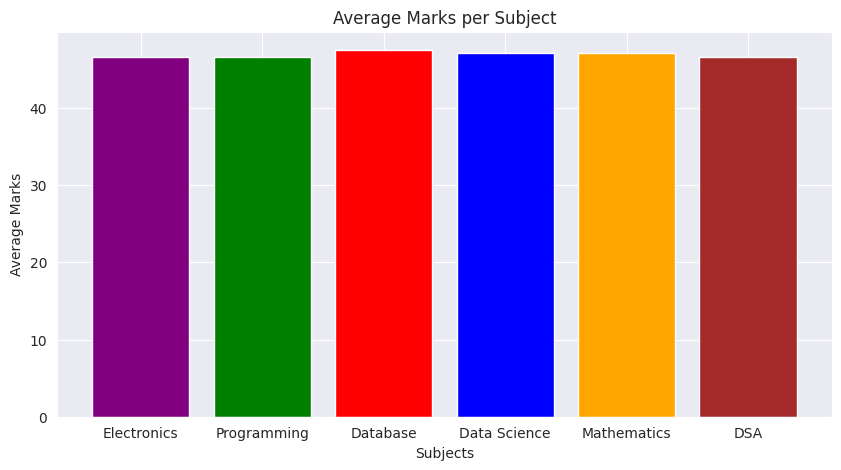

In [36]:
avg_marks = df_pandas[subjects].mean()

plt.figure(figsize=(10, 5))
plt.bar(subjects, avg_marks, color=['purple', 'green', 'red', 'blue', 'orange', 'brown'])
plt.xlabel("Subjects")
plt.ylabel("Average Marks")
plt.title("Average Marks per Subject")
plt.show()

In [74]:
df_spark.select([col(subject).cast("double") for subject in subjects]).summary("mean").show()

for sub1 in subjects:
    for sub2 in subjects:
        if sub1 != sub2:
            print(f"Correlation between {sub1} and {sub2}: {df_spark.stat.corr(sub1, sub2)}")

+-------+-----------+-----------+--------+------------+-----------+-------+
|summary|Electronics|Programming|Database|Data Science|Mathematics|    DSA|
+-------+-----------+-----------+--------+------------+-----------+-------+
|   mean|    47.2596|    47.1457| 47.4025|     47.0586|    47.1794|46.6242|
+-------+-----------+-----------+--------+------------+-----------+-------+

Correlation between Electronics and Programming: -0.013620469551361078
Correlation between Electronics and Database: 0.008318612145807407
Correlation between Electronics and Data Science: -0.011311323794809897
Correlation between Electronics and Mathematics: -0.014252268464066022
Correlation between Electronics and DSA: 0.01009253667261573
Correlation between Programming and Electronics: -0.013620469551361057
Correlation between Programming and Database: -0.002992532266844138
Correlation between Programming and Data Science: -0.0024855640823466334
Correlation between Programming and Mathematics: 0.00112157299908

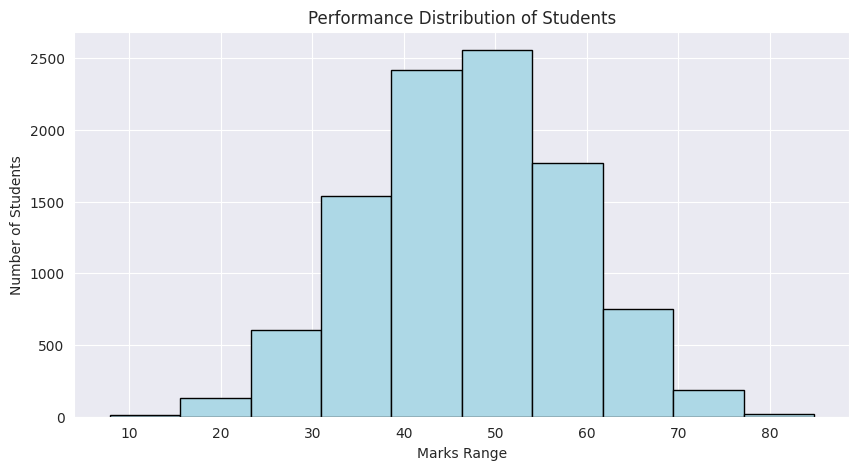

In [78]:
import matplotlib.pyplot as plt

df_pandas = df_spark.toPandas()

plt.figure(figsize=(10, 5))
plt.hist(df_pandas["Average_Marks"], bins=10, color="lightblue", edgecolor="black")
plt.xlabel("Marks Range")
plt.ylabel("Number of Students")
plt.title("Performance Distribution of Students")
plt.show()

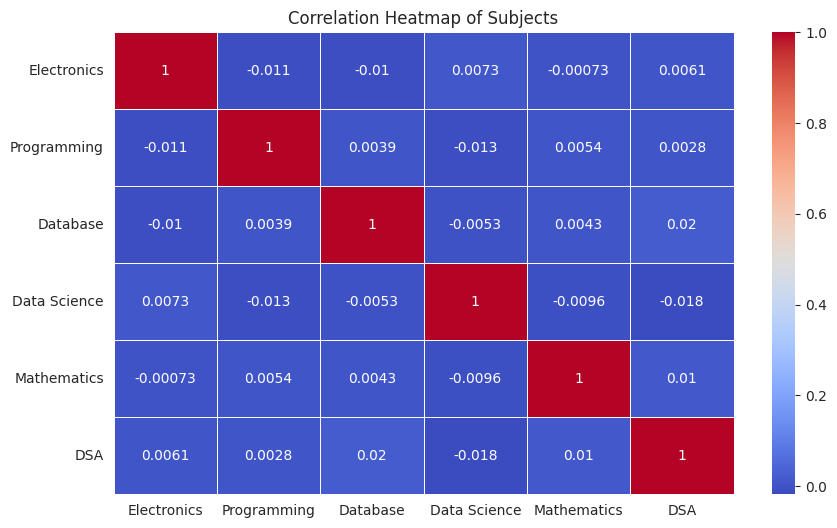

In [42]:
plt.figure(figsize=(10, 6))
corr_matrix = df[['Electronics', 'Programming', 'Database', 'Data Science', 'Mathematics', 'DSA']].corr()
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap of Subjects")
plt.show()

<Figure size 1200x1000 with 0 Axes>

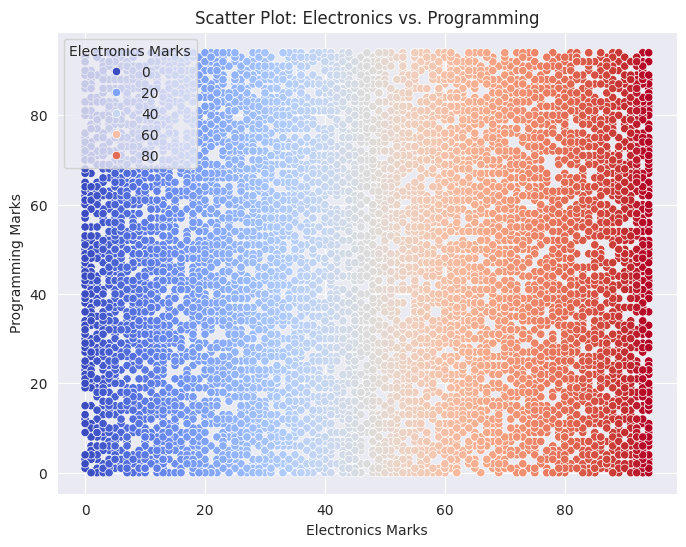

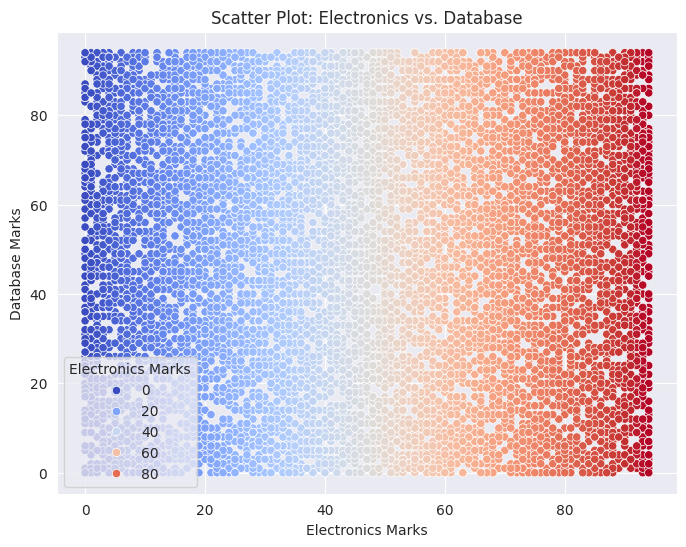

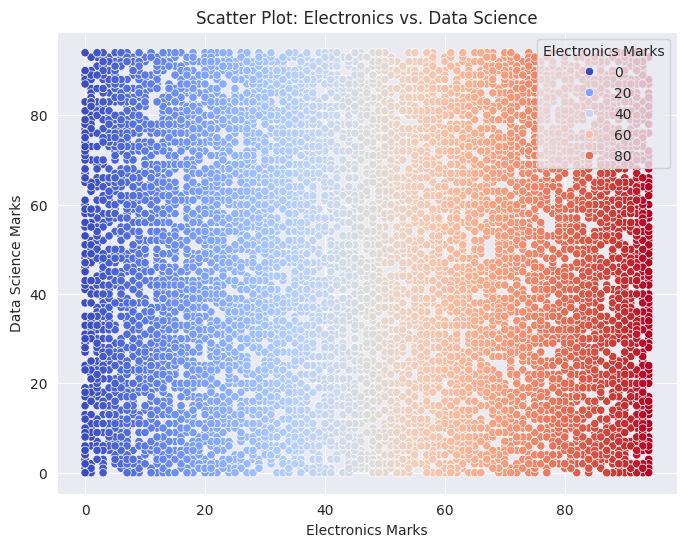

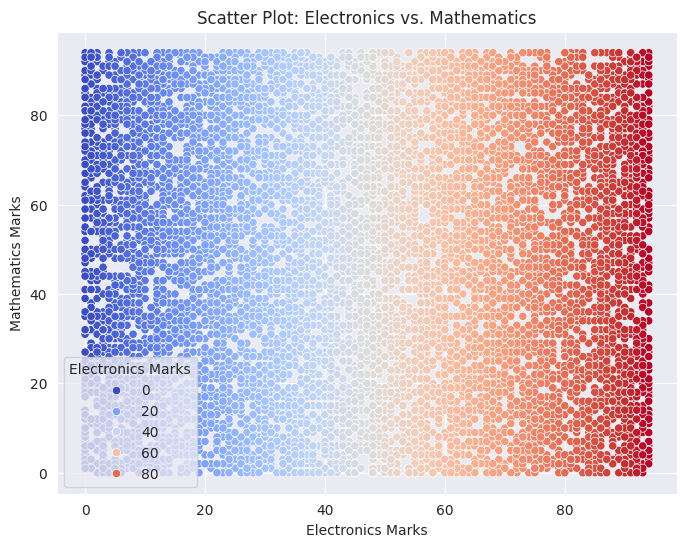

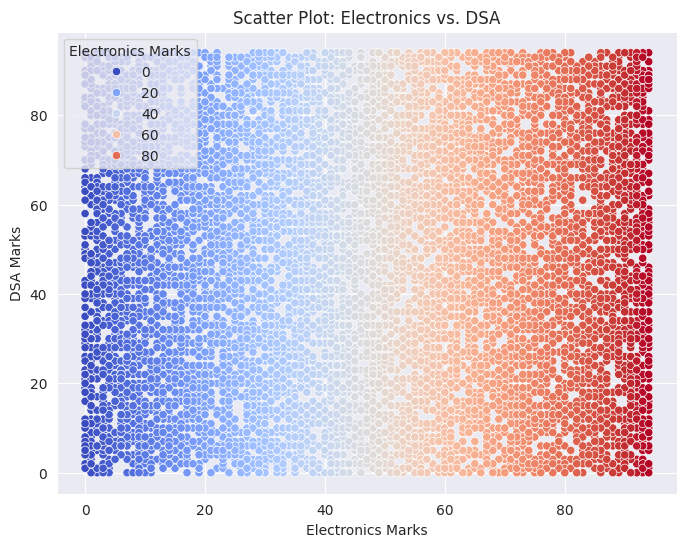

...

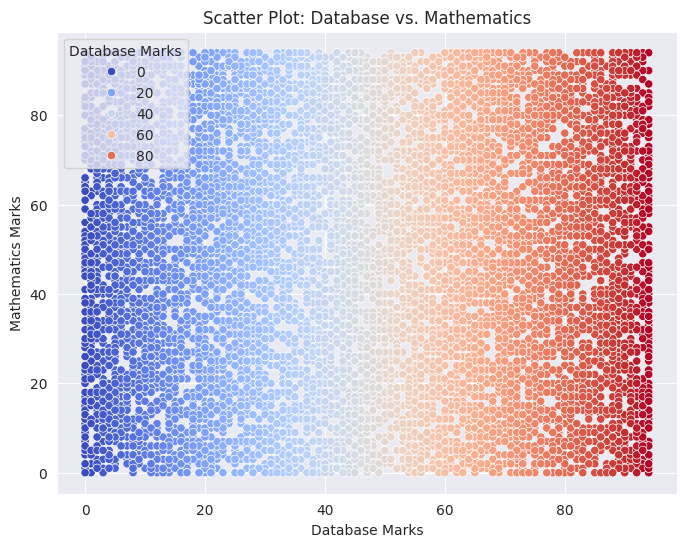

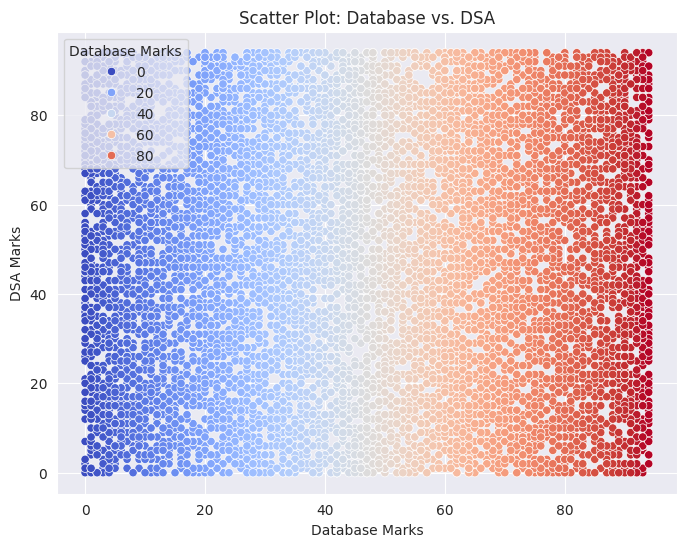

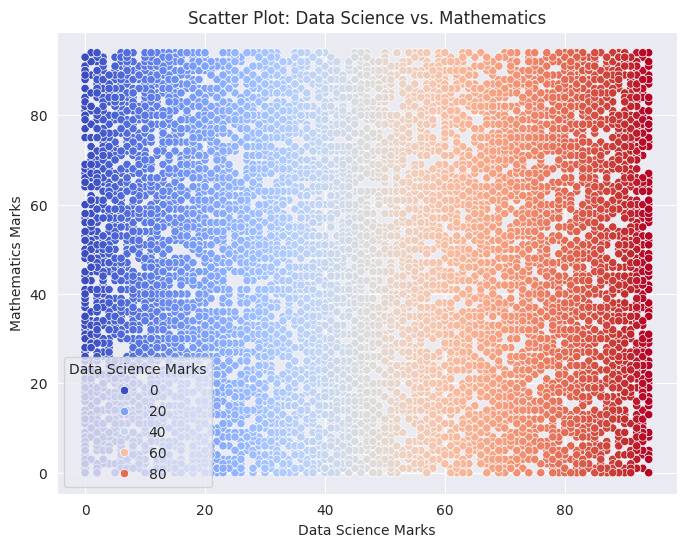

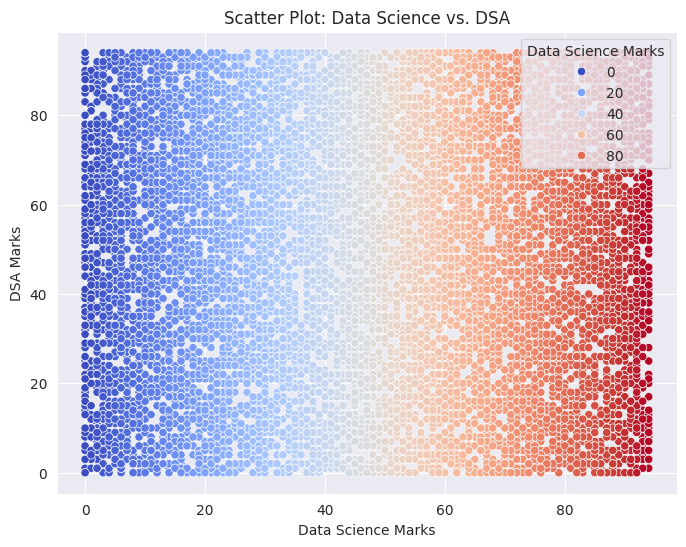

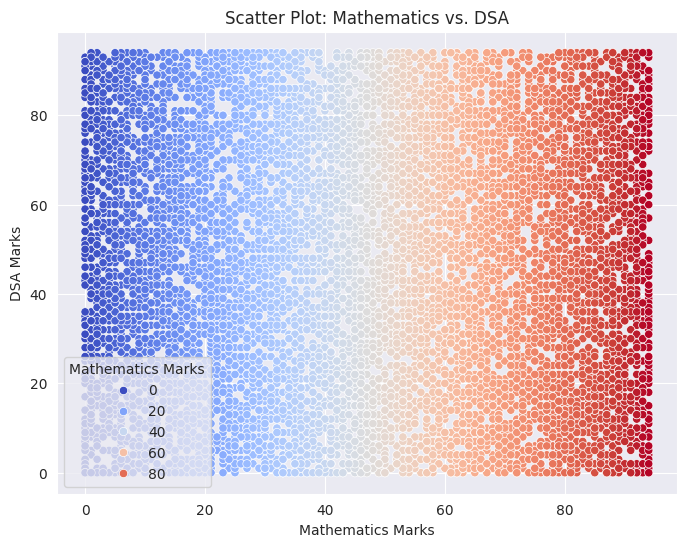

In [79]:
plt.figure(figsize=(12, 10))
for i in range(len(subjects)):
    for j in range(i + 1, len(subjects)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df[subjects[i]], y=df[subjects[j]], hue=df[subjects[i]], palette='coolwarm')
        plt.title(f'Scatter Plot: {subjects[i]} vs. {subjects[j]}')
        plt.xlabel(f'{subjects[i]} Marks')
        plt.ylabel(f'{subjects[j]} Marks')
        plt.legend(title=f'{subjects[i]} Marks')
        plt.show()

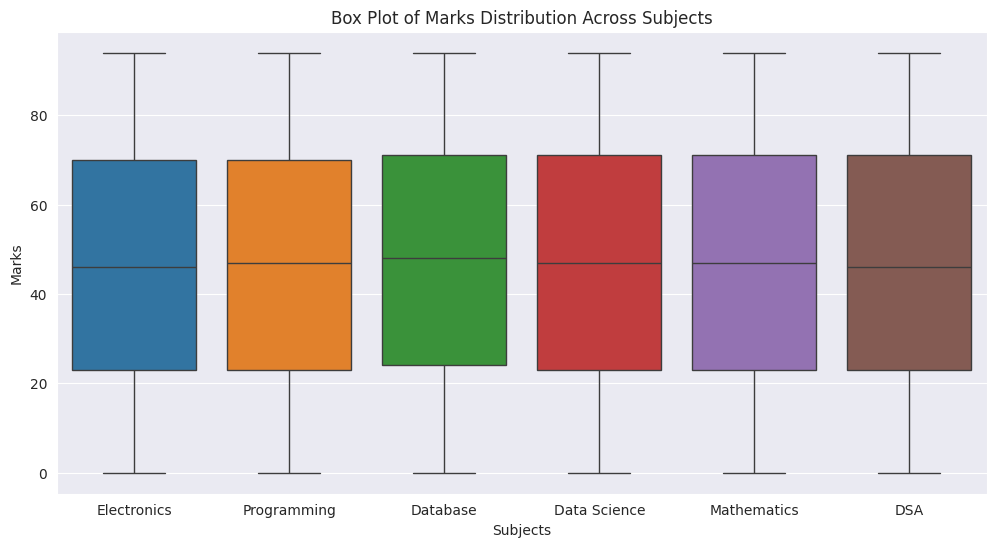

In [39]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[['Electronics', 'Programming', 'Database', 'Data Science', 'Mathematics', 'DSA']])
plt.title("Box Plot of Marks Distribution Across Subjects")
plt.xlabel("Subjects")
plt.ylabel("Marks")
plt.show()

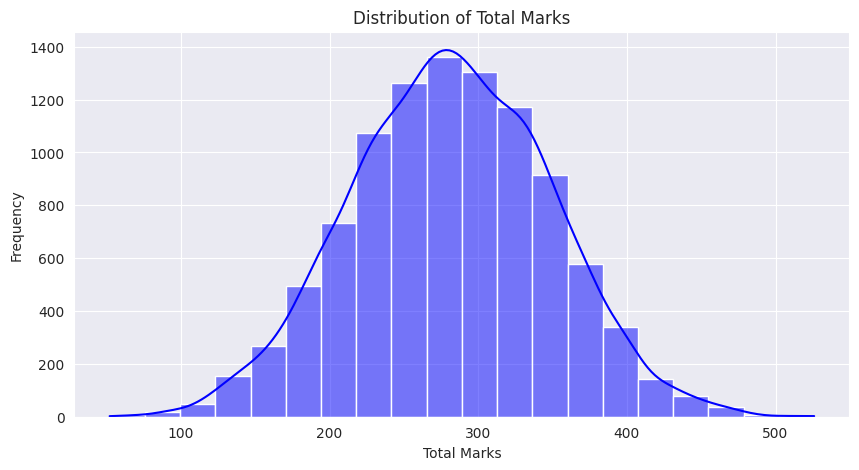

In [43]:
plt.figure(figsize=(10, 5))
sns.histplot(df['Total Marks'], bins=20, kde=True, color='blue')
plt.title("Distribution of Total Marks")
plt.xlabel("Total Marks")
plt.ylabel("Frequency")
plt.show()

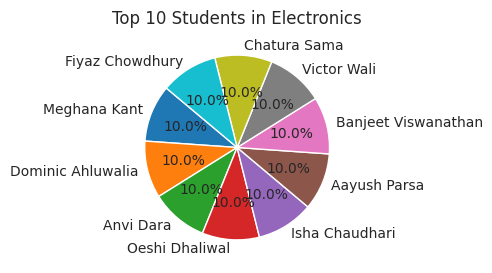

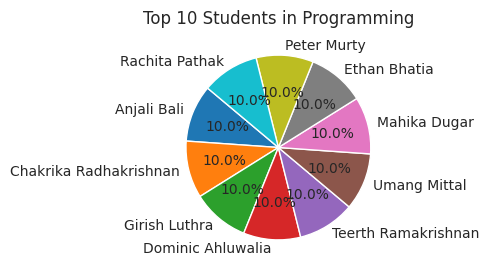

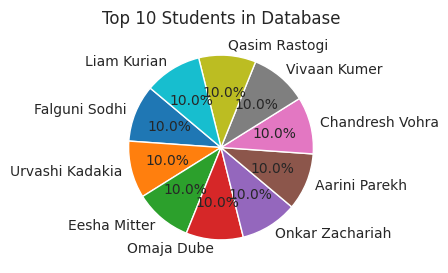

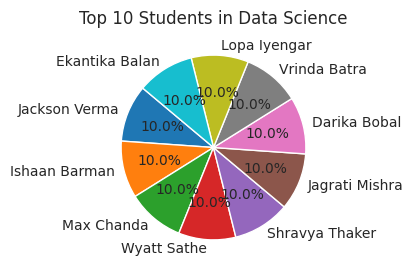

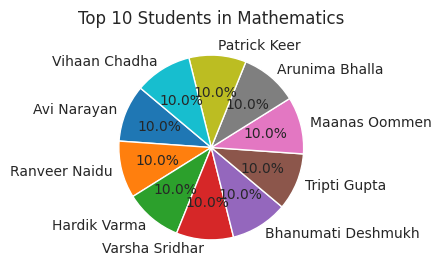

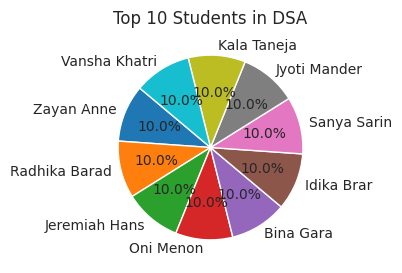

In [46]:
subjects = ['Electronics', 'Programming', 'Database', 'Data Science', 'Mathematics', 'DSA']
for subject in subjects:
    top_students_subject = df.nlargest(10, subject)
    plt.figure(figsize=(3, 3))
    plt.pie(top_students_subject[subject], labels=top_students_subject['Name'], autopct='%1.1f%%', startangle=140)
    plt.title(f"Top 10 Students in {subject}")
    plt.show()

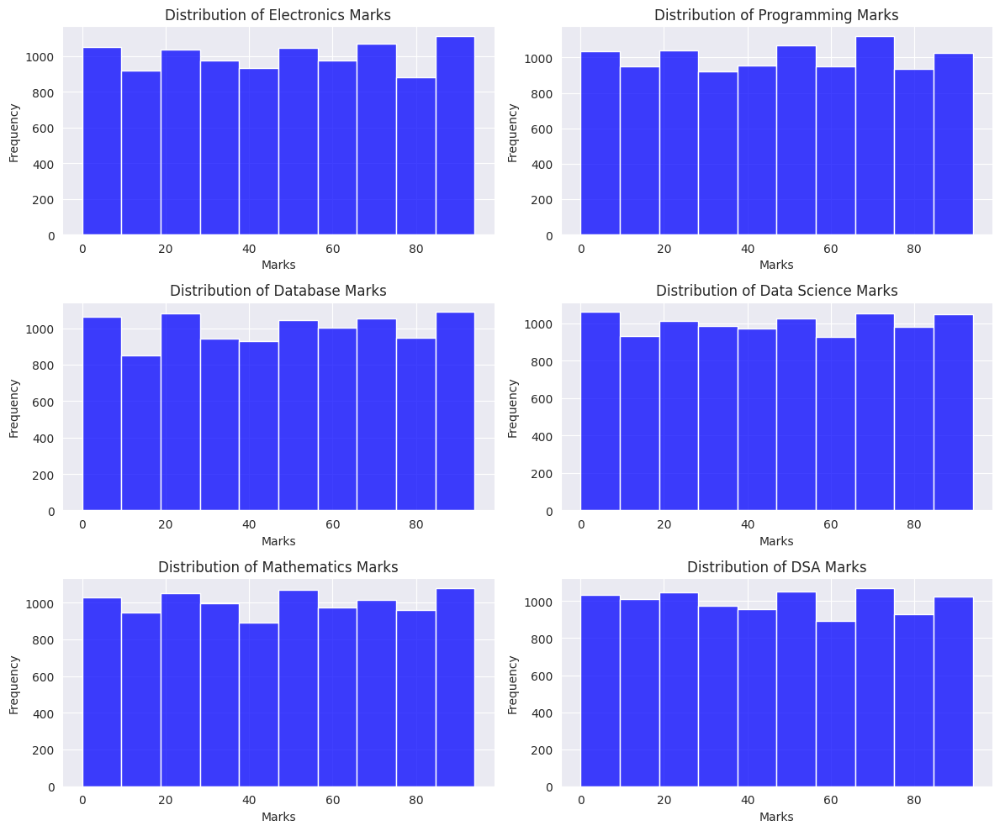

In [80]:
plt.figure(figsize=(12, 10))
for i, subject in enumerate(subjects, 1):
    plt.subplot(3, 2, i)
    sns.histplot(df[subject], bins=10, kde=False, color='b')
    plt.title(f'Distribution of {subject} Marks')
    plt.xlabel('Marks')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()